# Energiegewinnung- und verbrauch Dartellung

## Energieverbrauch im verarbeitenden Gerwerbe

#### setup

In [2]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
from difflib import SequenceMatcher
import tkinter as tk
from tkinter import ttk
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.backends.backend_tkagg import FigureCanvasTkAgg
import math


In [2]:
## read in german map
kreise = gpd.read_file('1_sehr_hoch.geojson')

In [3]:
# read in data from energy usage of the manufacturing industry
verGer = pd.read_excel("energie_verGer.xlsx")

#### list setup

In [5]:
## create lists to plot data
c = 0
c2 = 0
d = {}
no_v = []
no_g = []
for value_name in range(7,495):
    for kreis_name in range(len(kreise)):
        if type(verGer.Landkreis[value_name]) == str:
            if verGer.Landkreis[value_name].split(",")[0] == kreise.NAME_3[kreis_name]:
                #print(kreise.NAME_3[kreis_name])
                d[value_name] = kreis_name
                c += 1
            elif verGer.Landkreis[value_name].split(",")[0] == kreise.NAME_3[kreis_name].split()[0]:
                #print(kreise.NAME_3[kreis_name])
                d[value_name] = kreis_name
                c += 1
    if c == c2:       
        no_v.append(verGer.Landkreis[value_name])
    c2 = c

In [6]:
## alternative lists to plot
c = 0
c2 = 0
d = {}
#no_v = []
no_g = []

for kreis_name in range(len(kreise)):
    for value_name in range(7,495):
        if type(verGer.Landkreis[value_name]) == str:
            if verGer.Landkreis[value_name].split(",")[0] == kreise.NAME_3[kreis_name]:
                #print(kreise.NAME_3[kreis_name])
                d[value_name] = kreis_name
                c += 1
            elif verGer.Landkreis[value_name].split(",")[0] == kreise.NAME_3[kreis_name].split()[0]:
                #print(kreise.NAME_3[kreis_name])
                d[value_name] = kreis_name
                c += 1
            elif verGer.Landkreis[value_name].split("-")[:2] == kreise.NAME_3[kreis_name].split("-")[:2]:
                d[value_name] = kreis_name
                c += 1
    if c == c2:       
        no_g.append(kreise.NAME_3[kreis_name])
    c2 = c
                

In [7]:
## match map with value data
mat = SequenceMatcher(None, "test", "xxxx").find_longest_match()
col = 0
d2 = {}
d3 = {}
akk = []
for kreis_name in range(len(kreise)):
    if "Städte" in kreise.NAME_3[kreis_name]:
        kreis = kreise.NAME_3[kreis_name][:-7]
    else:
        kreis = kreise.NAME_3[kreis_name]
    for value_name in range(7,495):

        aku = SequenceMatcher(None,verGer.Landkreis[value_name].split(",")[0],kreis).find_longest_match()
        if aku[2] > mat[2]:
            akk.append(aku[2])
            col = value_name
            mat = aku
    d2[kreis_name] = col
    d3[kreise.NAME_3[kreis_name]] =verGer.Landkreis[col]
    mat = SequenceMatcher(None, "test", "xxxx").find_longest_match()

In [8]:
## lists for plots
name_value = []
name_location = []
geometry = []
value = []
for ky in d2.keys():
    name_value.append(verGer.Landkreis[d2[ky]])
    name_location.append(kreise.NAME_3[ky])
    geometry.append(kreise.geometry[ky])
    try:
        value.append(float(verGer.insgesamt[d2[ky]]))
    except ValueError:
        value.append(0)
    

In [9]:
## data for tkinter
plot_dict = {k:([],[]) for k in name_value}
for j in range(7, len(verGer)):
    if type(verGer.Landkreis[j]) == str:
        if verGer.Landkreis[j] in plot_dict.keys():
            x, y = plot_dict[verGer.Landkreis[j]]
            try: 
                y.append(int(verGer.insgesamt[j]))
            except ValueError:
                y.append(0)
            x.append(2022-len(x))
            plot_dict[verGer.Landkreis[j]] = (x,y)


In [10]:
number_dict = {name_value[k]:k for k in range(len(name_value))}

#### plot data

In [11]:
## create dataframe 
df = pd.DataFrame(
    {
        "name_value": name_value,
        "name_location": name_location,
        "value": value,
        "geometry": geometry,
    }
)

In [12]:
gdf = gdf = gpd.GeoDataFrame(
    df, geometry=geometry
)

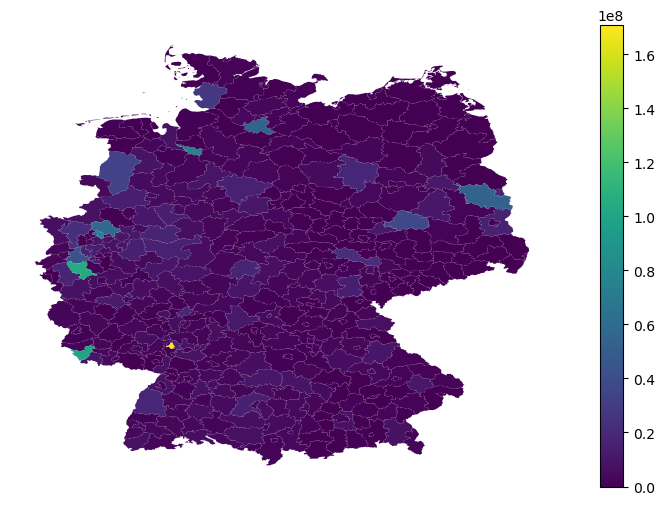

In [16]:
## plot data with geopandas
gdf.plot("value", legend=True, figsize=(12,6)).set_axis_off()
gdf.explore("value", vmax=10000000) #vmax to change color map

#### windows


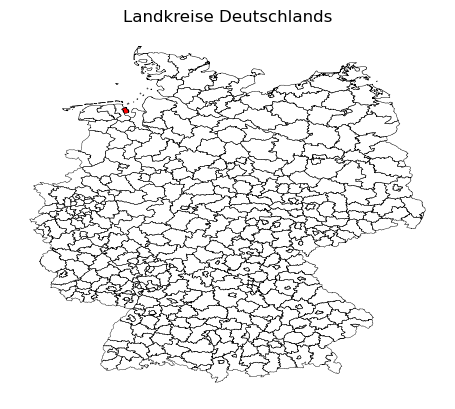

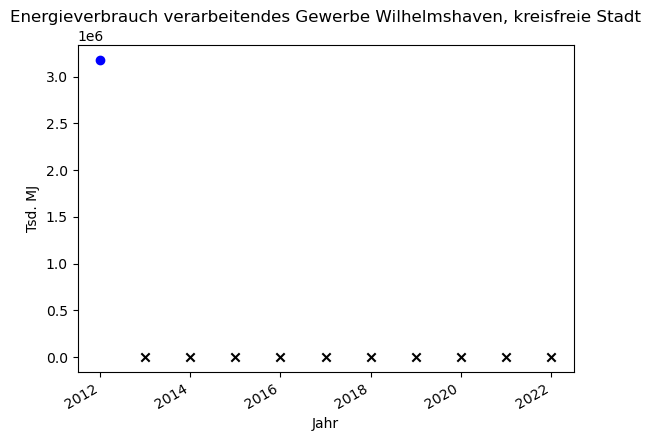

In [17]:
### show the data in a window
class MainWindow(tk.Tk):
    def __init__(self):
        super().__init__()
        self.title("Main Window")
        
        ## Read GeoPandas dataframe
        self.gdf = gdf
        
        ## Create a plot on the main window
        self.figure, self.ax = plt.subplots()
        self.plot_data(self.gdf)
        self.canvas = FigureCanvasTkAgg(self.figure, master=self)
        self.canvas.draw()
        self.canvas.get_tk_widget().pack(side=tk.TOP, fill=tk.BOTH, expand=1)
        
        ## Create a dropdown menu (combobox)
        self.options_label = ttk.Label(self, text="Select an option:")
        self.options_label.pack(pady=(10, 0))
        
        self.selected_option = tk.StringVar()
        self.options_combobox = ttk.Combobox(self, textvariable=self.selected_option)
        self.options_combobox['values'] = name_value
        self.options_combobox.bind("<<ComboboxSelected>>", self.update_plot)
        self.options_combobox.pack(pady=(0, 10))
    ## plot the startwindow    
    def plot_data(self, gdf):
        gdf.boundary.plot(ax=self.ax, color="k", linewidth=0.3).set_axis_off()
        self.ax.set_title('Landkreise Deutschlands')

    def plot_one(self,gdf, ax, option):
        gdf.boundary.plot(ax=ax, color="k", linewidth=0.3).set_axis_off()
        gdf[number_dict[option]:number_dict[option]+1].plot(ax=ax, color="r").set_axis_off()
        self.ax.set_title('Landkreise Deutschlands')

    def update_plot(self, event=None):
        ## Get selected option
        option = self.selected_option.get()
         ## Clear previous plot on the main window
        self.ax.clear()
        self.plot_one(self.gdf, self.ax,option)

        ## Create a new window for the plot
        new_plot_window = tk.Toplevel(self)
        
        ## Create a plot in the new window
        figure, ax = plt.subplots()
        (x,y) = plot_dict[option]
        for ye in range(len(x)):
            x[ye] = pd.to_datetime(str(x[ye]))
        for year in range(len(x)):
            if y[year] == 0:
                ax.scatter(x[year], y[year], marker="x", color="k")
            else:
                ax.scatter(x[year], y[year], marker="o", color="b")
        plt.gcf().autofmt_xdate()

        ax.set_ylabel("Tsd. MJ")
        ax.set_xlabel("Jahr")
        ax.set_title(f"Energieverbrauch verarbeitendes Gewerbe {option}")
        
        ## Embed the plot into the new window
        canvas = FigureCanvasTkAgg(figure, master=new_plot_window)
        canvas.draw()
        canvas.get_tk_widget().pack(side=tk.TOP, fill=tk.BOTH, expand=1)
        
        # Redraw the plot
        self.canvas.draw()

def main():
    app = MainWindow()
    app.mainloop()

if __name__ == "__main__":
    main()


## Marktstammdaten

##### daten

In [34]:
## read the markstammdaten 
sheet1 = pd.read_csv("Stromerzeuger_1_bis_1000000.csv", sep=";")
sheet2 = pd.read_csv("Stromerzeuger_1000001_bis_2000000.csv", sep=";")
sheet3 = pd.read_csv("Stromerzeuger_2000001_bis_3000000.csv", sep=";")
sheet4 = pd.read_csv("Stromerzeuger_3000001_bis_4000000.csv", sep=";")
sheet5 = pd.read_csv("Stromerzeuger_4000001_bis_5000000.csv", sep=";")
sheet6 = pd.read_csv("Stromerzeuger_5000001_bis_5319380.csv", sep=";")

/var/folders/s_/_81pp_h546q9w04t54lch05w0000gn/T/ipykernel_7946/3196437221.py:2: DtypeWarning: Columns (9,21,22,31) have mixed types. Specify dtype option on import or set low_memory=False.
  sheet1 = pd.read_csv("Stromerzeuger_1_bis_1000000.csv", sep=";")
/var/folders/s_/_81pp_h546q9w04t54lch05w0000gn/T/ipykernel_7946/3196437221.py:3: DtypeWarning: Columns (21,31,45) have mixed types. Specify dtype option on import or set low_memory=False.
  sheet2 = pd.read_csv("Stromerzeuger_1000001_bis_2000000.csv", sep=";")
/var/folders/s_/_81pp_h546q9w04t54lch05w0000gn/T/ipykernel_7946/3196437221.py:4: DtypeWarning: Columns (9,13,20,21,22,23,24,35,45) have mixed types. Specify dtype option on import or set low_memory=False.
  sheet3 = pd.read_csv("Stromerzeuger_2000001_bis_3000000.csv", sep=";")
/var/folders/s_/_81pp_h546q9w04t54lch05w0000gn/T/ipykernel_7946/3196437221.py:5: DtypeWarning: Columns (12,20,21,22,23,24,25,45,46,47,48,49) have mixed types. Specify dtype option on import or set low_mem

In [29]:
#sheet = pd.concat([sheet1,sheet2,sheet3,sheet4,sheet5,sheet6])
sheet = sheet1.append(sheet2.append(sheet3.append(sheet4.append(sheet5.append(sheet6)))))

/var/folders/s_/_81pp_h546q9w04t54lch05w0000gn/T/ipykernel_7946/521134283.py:2: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  sheet = sheet1.append(sheet2.append(sheet3.append(sheet4.append(sheet5.append(sheet6)))))
/var/folders/s_/_81pp_h546q9w04t54lch05w0000gn/T/ipykernel_7946/521134283.py:2: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  sheet = sheet1.append(sheet2.append(sheet3.append(sheet4.append(sheet5.append(sheet6)))))
/var/folders/s_/_81pp_h546q9w04t54lch05w0000gn/T/ipykernel_7946/521134283.py:2: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  sheet = sheet1.append(sheet2.append(sheet3.append(sheet4.append(sheet5.append(sheet6)))))
/var/folders/s_/_81pp_h546q9w04t54lch05w0000gn/T/ipykernel_7946/521134283.py:2: Futur

In [30]:
## read in map of germany
gmdsch = {}
karte_ger = gpd.read_file("/Users/boarnold/Downloads/georef-germany-kreis@public.geojson")
for line in range(len(karte_ger)):
    gmdsch[karte_ger.krs_code[line][0]] = karte_ger.krs_name[line][0]

lks = {value: key for key,value in gmdsch.items()}

401

#### analyse

In [36]:
## create lists to visualize
lk_leistung = {lk:([],[],[]) for lk in lks.keys()}
enrgieart = {lk:([],[],[]) for lk in lks.keys()}
for sh in [sheet1,sheet2,sheet3,sheet4,sheet5,sheet6]:

    for line in range(len(sh)):
        try:
            if type(sh.Nettonennleistung_der_Einheit[line]) == str:
                if str(sh.Gemeindeschlüssel[line])[0] == "1":
                    datum , leistung, indices = lk_leistung[gmdsch[str(sh.Gemeindeschlüssel[line])[:5]]] 

                else:
                    datum, leistung, indices = lk_leistung[gmdsch['0' + str(sh.Gemeindeschlüssel[line])[:4]]]
                if type(sh.Inbetriebnahmedatum_der_Einheit[line]) == str:
                    datum.append(sh.Inbetriebnahmedatum_der_Einheit[line])
                    leistung.append(float(str(sh.Nettonennleistung_der_Einheit[line]).replace(",",".")))
                    indices.append(line)
        except KeyError:
            pass
    

In [31]:
## create lists to visualize
lk_leistung = {lk:([],[],[]) for lk in lks.keys()}
enrgieart = {lk:([],[],[]) for lk in lks.keys()}
for line in range(len(sheet)):
    print(line/5325012)
    try:
        if type(sheet.Nettonennleistung_der_Einheit[line]) == str:
            if str(sheet.Gemeindeschlüssel[line])[0] == "1":
                datum , leistung, indices = lk_leistung[gmdsch[str(sheet.Gemeindeschlüssel[line])[:5]]] 

            else:
                datum, leistung, indices = lk_leistung[gmdsch['0' + str(sheet.Gemeindeschlüssel[line])[:4]]]
            if type(sheet.Inbetriebnahmedatum_der_Einheit[line]) == str:
                datum.append(sheet.Inbetriebnahmedatum_der_Einheit[line])
                leistung.append(float(str(sheet.Nettonennleistung_der_Einheit[line]).replace(",",".")))
                indices.append(line)
    except KeyError:
        pass
    

0.0
1.877930040345449e-07
3.755860080690898e-07
5.633790121036347e-07
7.511720161381796e-07
9.389650201727245e-07
1.1267580242072693e-06
1.3145510282418142e-06
1.5023440322763592e-06
1.690137036310904e-06
1.877930040345449e-06
2.065723044379994e-06
2.2535160484145386e-06
2.4413090524490838e-06
2.6291020564836285e-06
2.8168950605181736e-06
3.0046880645527183e-06
3.1924810685872635e-06
3.380274072621808e-06
3.568067076656353e-06
3.755860080690898e-06
3.943653084725443e-06
4.131446088759988e-06
4.319239092794533e-06
4.507032096829077e-06
4.6948251008636224e-06
4.8826181048981676e-06
5.070411108932712e-06
5.258204112967257e-06
5.445997117001802e-06
5.633790121036347e-06
5.8215831250708915e-06
6.009376129105437e-06
6.197169133139982e-06
6.384962137174527e-06
6.572755141209071e-06
6.760548145243616e-06
6.9483411492781615e-06
7.136134153312706e-06
7.323927157347251e-06
7.511720161381796e-06
7.699513165416341e-06
7.887306169450885e-06
8.075099173485431e-06
8.262892177519976e-06
8.4506851815545

KeyboardInterrupt: 

#### plot

In [21]:
## create lists for plotting
name_kreis = []
geometry_kreis = []
value_production = []
for st in range(len(lk_leistung.keys())):
    name_kreis.append(list(lk_leistung.keys())[st])
    datum, leistung, indices = lk_leistung[list(lk_leistung.keys())[st]]
    value_production.append(sum(leistung))
    geometry_kreis.append(karte_ger.geometry[st])
    
    

In [22]:
## create dataframe to plot
df2 = pd.DataFrame(
    {
        "name_kreis": name_kreis,
        "value": value_production,
        "geometry": geometry_kreis,
    }
)
gdf2 = gpd.GeoDataFrame(
    df2, geometry=geometry_kreis
)

In [23]:
# plot values
gdf2.explore("value")

#### window programm

In [25]:
## setup for window
numbering = {name_kreis[k]:k for k in range(len(name_kreis))}

andere Gase
Grubengas
Klärschlamm
Klärschlamm
andere Gase
Klärschlamm
andere Gase
andere Gase
Wärme
Wärme
andere Gase
andere Gase
andere Gase
andere Gase
Grubengas
Steinkohle
andere Gase
andere Gase
Grubengas
Grubengas
Grubengas
Grubengas
andere Gase
andere Gase
andere Gase
andere Gase
andere Gase
andere Gase
andere Gase
andere Gase
andere Gase
andere Gase
andere Gase
andere Gase
andere Gase
andere Gase
Wärme
andere Gase
andere Gase
andere Gase
andere Gase
andere Gase
andere Gase
andere Gase
andere Gase
andere Gase
andere Gase
andere Gase
andere Gase
andere Gase
andere Gase
andere Gase
andere Gase
andere Gase
andere Gase
andere Gase
Wärme
andere Gase
andere Gase
andere Gase
andere Gase
andere Gase
andere Gase
Klärschlamm
Klärschlamm
andere Gase
andere Gase
Klärschlamm
andere Gase
andere Gase
andere Gase
andere Gase
andere Gase
andere Gase
andere Gase
andere Gase
andere Gase
andere Gase
andere Gase
andere Gase
andere Gase
andere Gase
andere Gase
andere Gase
andere Gase
andere Gase


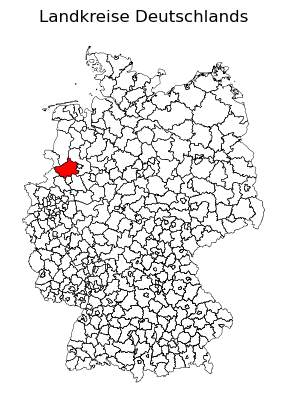

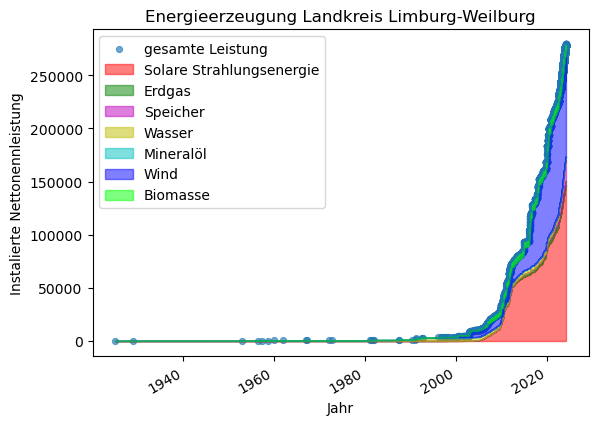

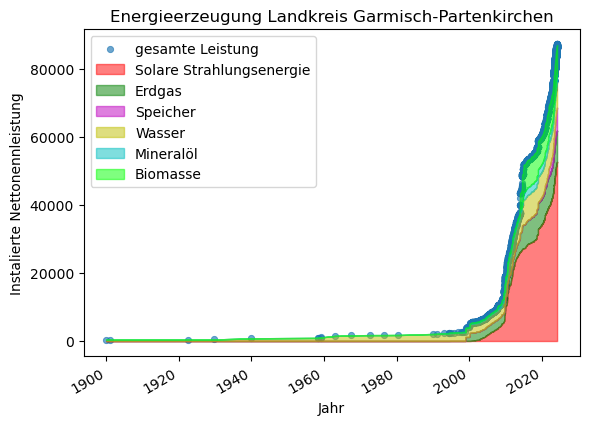

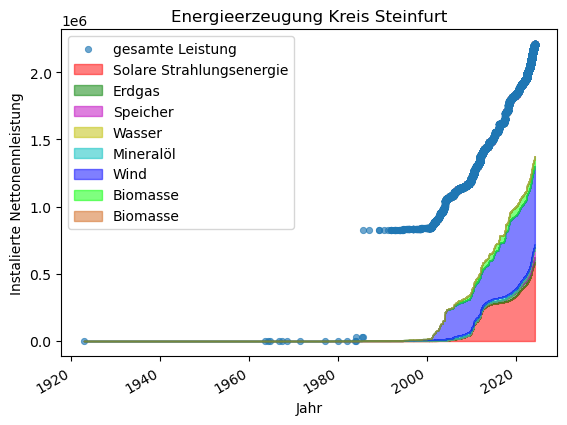

In [31]:
## create window for visualization
class MainWindow(tk.Tk):
    def __init__(self):
        super().__init__()
        self.title("Main Window")
        
        ## Read GeoPandas dataframe
        self.gdf = karte_ger
        
        ## Create a plot on the main window
        self.figure, self.ax = plt.subplots()
        self.plot_data(self.gdf)
        self.canvas = FigureCanvasTkAgg(self.figure, master=self)
        self.canvas.draw()
        self.canvas.get_tk_widget().pack(side=tk.TOP, fill=tk.BOTH, expand=1)
        
        ## Create a dropdown menu (combobox)
        self.options_label = ttk.Label(self, text="Select an option:")
        self.options_label.pack(pady=(10, 0))

        self.selected_option = tk.StringVar()
        self.options_combobox = ttk.Combobox(self, textvariable=self.selected_option)
        self.options_combobox['values'] = name_kreis
        self.options_combobox.bind("<<ComboboxSelected>>", self.update_plot)
        self.options_combobox.pack(pady=(0, 10))

        ## Create a dropdown menu (combobox)
        self.options_label = ttk.Label(self, text="specify the diagram:")
        self.options_label.pack(pady=(10, 0))

        self.selected_option_sp  = tk.StringVar(value='Standart')
        self.options_combobox = ttk.Combobox(self, textvariable=self.selected_option_sp)
        self.options_combobox['values'] = ["Standart", "Art der Erzeugung", "Spannungsart"]
        self.options_combobox.bind("<<ComboboxSelected>>")
        self.options_combobox.pack(pady=(0, 10))
        



    ## plot start window
    def plot_data(self, gdf):
        karte_ger.boundary.plot(ax=self.ax, color="k", linewidth=0.3).set_axis_off()
        self.ax.set_title('Landkreise Deutschlands')

    ## plot selected district
    def plot_one(self,gdf, ax, option):
        karte_ger.boundary.plot(ax=ax, color="k", linewidth=0.3).set_axis_off()
        karte_ger[numbering[option]:numbering[option]+1].plot(ax=ax, color="r").set_axis_off()
        self.ax.set_title('Landkreise Deutschlands')

    def update_plot(self, event=None):
        ## Get selected option
        option = self.selected_option.get()
        option2 = self.selected_option_sp.get()
         ## Clear previous plot on the main window
        self.ax.clear()
        self.plot_one(self.gdf, self.ax,option)

        ## Create a new window for the plot
        new_plot_window = tk.Toplevel(self)
        
        ## Create a plot in the new window
        figure, ax = plt.subplots()
        datum, leistung, indices = lk_leistung[option]
        datum = [pd.to_datetime(d, dayfirst=True) for d in datum]
        t = list(zip(datum, leistung, indices))
        t.sort()
        datum, leistung, indices= list(zip(*t))
        leistung2 = [sum(leistung[:n+1]) for n in range(len(leistung))]
        ax.scatter(datum, leistung2, alpha=0.65,linewidths=0.7, s=20, label="gesamte Leistung")
        ## options for selected plot, still not all energy sources noted
        if option2 == "Art der Erzeugung":
            solar = []
            so = 0
            erdgas = []
            eg = 0
            s = 0
            speicher = []
            w = 0
            wasser = []
            moe = 0
            mineraloel = []
            wi = 0
            wind = []
            bm = 0
            biomasse = []
            bk = 0
            braunkohle = []
            value_dict = {"solar": 0, "erdgas": 0, "speicher": 0, "wasser": 0, "mineraloel": 0, "wind":0, "biomasse": 0, "braunkohle":0}
            for x in indices:
                if sheet.Energieträger[x] == "Solare Strahlungsenergie":
                    so += float(sheet.Nettonennleistung_der_Einheit[x].replace(",","."))
                elif sheet.Energieträger[x] == "Erdgas":
                    eg += float(sheet.Nettonennleistung_der_Einheit[x].replace(",","."))
                elif sheet.Energieträger[x] == "Speicher":
                    s += float(sheet.Nettonennleistung_der_Einheit[x].replace(",","."))
                elif sheet.Energieträger[x] == "Wasser":
                    w += float(sheet.Nettonennleistung_der_Einheit[x].replace(",","."))
                elif sheet.Energieträger[x] == "Mineralölprodukte":
                    moe += float(sheet.Nettonennleistung_der_Einheit[x].replace(",","."))
                elif sheet.Energieträger[x] == "Wind":
                    wi += float(sheet.Nettonennleistung_der_Einheit[x].replace(",","."))
                elif sheet.Energieträger[x] == "Biomasse":
                    bm += float(sheet.Nettonennleistung_der_Einheit[x].replace(",","."))
                elif sheet.Energieträger[x] == "Braunkohle":
                    bk += float(sheet.Nettonennleistung_der_Einheit[x].replace(",","."))

                solar.append(so)
                value_dict["solar"] += so
                erdgas.append(eg+so)
                value_dict["erdgas"] += eg
                speicher.append(s+eg+so)
                value_dict["speicher"] += s
                wasser.append(so+eg+s+w)
                value_dict["wasser"] += w
                mineraloel.append(so+eg+s+w+moe)
                value_dict["mineraloel"] += moe
                wind.append(so+eg+s+w+moe+wi)
                value_dict["wind"] += wi
                biomasse.append(so+eg+s+w+moe+wi+bm)
                value_dict["biomasse"] += bm
                braunkohle.append(so+eg+s+w+moe+wi+bm+bk)
                value_dict["braunkohle"] += bk
            if value_dict["solar"] > 0:
                ax.fill_between(datum,solar,alpha=0.5,color="r",label="Solare Strahlungsenergie")
            if value_dict["erdgas"] > 0:
                ax.fill_between(datum,erdgas,solar,alpha=0.5,color="g", label="Erdgas")
            if value_dict["speicher"] > 0:
                ax.fill_between(datum,speicher,erdgas,alpha=0.5,color="m", label="Speicher")
            if value_dict["wasser"] > 0:
                ax.fill_between(datum,speicher,wasser,alpha=0.5,color="y", label="Wasser")
            if value_dict["mineraloel"] > 0:
                ax.fill_between(datum,wasser,mineraloel,alpha=0.5,color="c", label="Mineralöl")
            if value_dict["wind"] > 0:
                ax.fill_between(datum,mineraloel,wind,alpha=0.5,color="b", label="Wind")
            if value_dict["biomasse"] > 0:
                ax.fill_between(datum,wind,biomasse,alpha=0.5,color="lime", label="Biomasse")
            if value_dict["braunkohle"] > 0:
                ax.fill_between(datum,biomasse,braunkohle,alpha=0.5,color="chocolate", label="Braunkohle")

        ## secound option
        if option2 == "Spannungsart":
            nieder = []
            ni = 0
            hoch = []
            ho = 0
            mi = 0
            mittel = []
            for x in indices:
                if "Niederspannung (= Hausanschluss/Haushaltsstrom)" in str(sheet.Spannungsebene[x]):
                    ni += float(sheet.Nettonennleistung_der_Einheit[x].replace(",","."))
                elif "Mittelspannung" in str(sheet.Spannungsebene[x]):
                    mi += float(sheet.Nettonennleistung_der_Einheit[x].replace(",","."))
                elif "Höchstspannung" in str(sheet.Spannungsebene[x]):
                    ho += float(sheet.Nettonennleistung_der_Einheit[x].replace(",","."))
                else:
                    print(sheet.Spannungsebene[x])
                nieder.append(ni)
                mittel.append(mi+ni)
                hoch.append(mi+ni+ho)
            ax.fill_between(datum,nieder,alpha=0.5,color="r",label="Niederspannung")
            ax.fill_between(datum,mittel,nieder,alpha=0.5,color="g", label="Mittelspannung")
            ax.fill_between(datum,hoch,mittel,alpha=0.5,color="m", label="Höchstspannung")

        ax.set_ylabel("Instalierte Nettonennleistung")
        ax.set_xlabel("Jahr")
        ax.set_title(f"Energieerzeugung {option}")
        ax.legend()
        plt.gcf().autofmt_xdate()

        ## Embed the plot into the new window
        canvas = FigureCanvasTkAgg(figure, master=new_plot_window)
        canvas.draw()
        canvas.get_tk_widget().pack(side=tk.TOP, fill=tk.BOTH, expand=1)
        
        ## Redraw the plot
        self.canvas.draw()

def main():
    app = MainWindow()
    app.mainloop()

if __name__ == "__main__":
    main()
